# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [4]:
# from google.colab import drive
# drive.mount('/content/drive')

# !cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
# !unzip dataset.zip

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

## PREPROCESSING

In [5]:
import numpy as np
import cv2
from skimage.filters import unsharp_mask
from matplotlib import pyplot as plt
import re

The following function shows the denoising processes, and the various attempts that have been made to understand which of the various methods produced the best output. In this case, the returned value is dst_median7, which is the denoising that first applies a median filter with ksize = 7, and afterwarts the Non-Linear Means filter. 

In [6]:
def show_denoising(img, k_size, sigma, show):


    #TODO: Double median filter + bilateral
    img = cv2.imread(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    #median filter, then mean and finally bilateral
    median3 = cv2.medianBlur(img, 3)
    median3_bilateral = cv2.bilateralFilter(median3, 5, 150, 75)
    median3_twice = cv2.medianBlur(median3,3)
    median3_twice_bilateral5 = cv2.bilateralFilter(median3_twice, 5, 150, 75)

    image = cv2.medianBlur(img, 9)
    image = cv2.bilateralFilter(image, d=-1, sigmaColor=25, sigmaSpace=15)

    median5 = cv2.medianBlur(img, 5)
    median5_bilateral = cv2.bilateralFilter(median5, 5, 150, 75)
    median5_twice = cv2.medianBlur(median5,5)
    median5_twice_bilateral5 = cv2.bilateralFilter(median5, 7, 200, 150)

    #median filter with parameter 7, followed by bilateral
    median_5 = cv2.medianBlur(img, 5)
    bilateral_median7 = cv2.bilateralFilter(median_5, 9, 255, 255)

    #median filter with parameter 7, followed by Non Linear Means
    dst_median5 = cv2.fastNlMeansDenoisingColored(median_5,None,10,10,7,21)

    #cv2.bilateralFilter(img, filter_size, sigmaColor, sigmaSpace)
    bilateral = cv2.bilateralFilter(img, 5, 200, 75)

    #Now I want to try means and bilateral, as suggested
    means = cv2.fastNlMeansDenoisingColored(img,None,10,10,7,21)
    bilateral_means = cv2.bilateralFilter(means, 9, 150, 75)

    
    
    sharpening_kernel = np.array([[0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]])
    sharpened_image = cv2.filter2D(dst_median5, -1, sharpening_kernel)

    

    if show:
        fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(14, 8))
        
        # Plot each image in its corresponding subplot
        axes[0, 0].set_title('Original')
        axes[0, 0].imshow(img)
        axes[0, 1].set_title('xia')
        axes[0, 1].imshow(image)
        axes[1, 0].set_title('median3 x2 + bilateral')
        axes[1, 0].imshow(median3_twice_bilateral5)
        axes[1, 1].set_title('median5 + bilateral')
        axes[1, 1].imshow(median5_bilateral)
        axes[0, 2].set_title('median5 x2 + bilateral')
        axes[0, 2].imshow(median5_twice_bilateral5)
        axes[1, 2].set_title('dst_median7')
        axes[1, 2].imshow(dst_median5)
        plt.savefig('./dataset/denoising.png')
        plt.show()
    return image

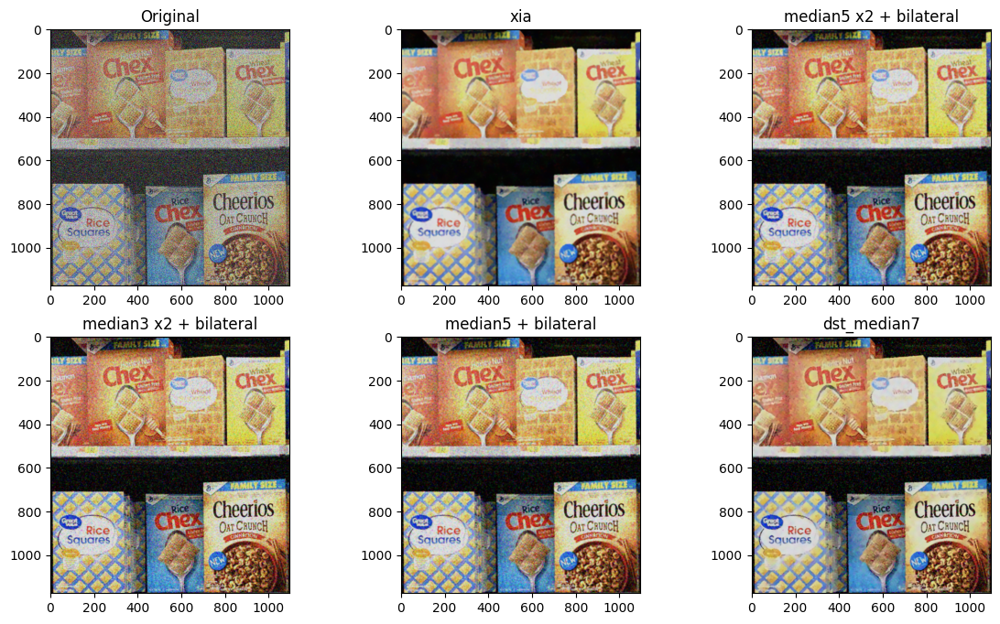

In [7]:
#scene1_dn = show_denoising(scene1_rgb, 5, 1.5, True)
scene1_dn = show_denoising('./dataset/scenes/scene4.png', 9, 3, True)


In [8]:
def extract_number(string):
    # Using regex to find numbers in the string
    numbers = re.findall(r'\d+', string)
    # Returning the first number found (if any)
    return int(numbers[0]) if numbers else None

In [9]:
#Save a denoised version of each background
def denoise_scenes(img_path, kind):
    #####BEFORE RUNNING THIS CREATE A 'denoised_scenes' folder inside 'dataset'
    img= cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_index= extract_number(img_path)

    img = cv2.medianBlur(img, 9)
    img = cv2.bilateralFilter(img, d=-1, sigmaColor=25, sigmaSpace=15)

    img_write = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    cv2.imwrite(f'./dataset/denoised_scenes/scene{img_index}.png', img_write)



In [10]:
## SCENE ARRAYS CREATION
scenes_path = './dataset/scenes/scene'

scene_idx_start_a = 1
scene_idx_end_a = 5
scene_idx_start_b = 6
scene_idx_end_b = 12

scenes_a = [f"{scenes_path}{i}.png" for i in range(scene_idx_start_a, scene_idx_end_a + 1)]
scenes_b = [f"{scenes_path}{i}.png" for i in range(scene_idx_start_b, scene_idx_end_b + 1)]


#SCENE DENOISING
for scene in scenes_a:
    denoise_scenes(scene, 'tutti')
for scene in scenes_b:
    denoise_scenes(scene, 'tutti')


#DENOISED SCENES ARRAYS
dn_scenes_path = './dataset/denoised_scenes/scene'
dn_scenes_a = [f"{dn_scenes_path}{i}.png" for i in range(scene_idx_start_a, scene_idx_end_a + 1)]
dn_scenes_b = [f"{dn_scenes_path}{i}.png" for i in range(scene_idx_start_b, scene_idx_end_b + 1)]


#MODELS ARRAYS CREATION
models_path = './dataset/models/ref'

start_index_a = 1
end_index_a = 14
start_index_b = 15
end_index_b = 27

objs_a = [f"{models_path}{i}.png" for i in range(start_index_a, end_index_a )]
objs_b = [f"{models_path}{i}.png" for i in range(start_index_b, end_index_b )]




In [11]:
objs_b

['./dataset/models/ref15.png',
 './dataset/models/ref16.png',
 './dataset/models/ref17.png',
 './dataset/models/ref18.png',
 './dataset/models/ref19.png',
 './dataset/models/ref20.png',
 './dataset/models/ref21.png',
 './dataset/models/ref22.png',
 './dataset/models/ref23.png',
 './dataset/models/ref24.png',
 './dataset/models/ref25.png',
 './dataset/models/ref26.png']

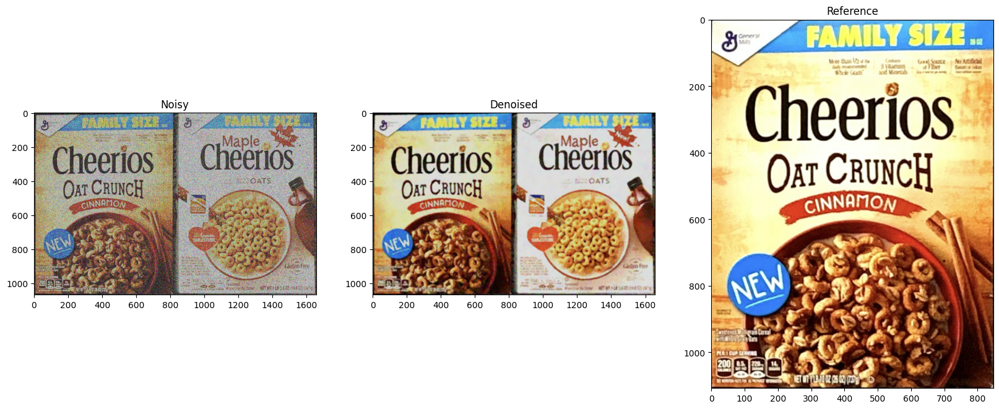

In [12]:
#show noisy vs denoised
scene1_img = cv2.imread(scenes_a[0])
scene1_rgb = cv2.cvtColor(scene1_img, cv2.COLOR_BGR2RGB)

scene1dn_img = cv2.imread(dn_scenes_a[0])
scene1dn_rgb = cv2.cvtColor(scene1dn_img, cv2.COLOR_BGR2RGB)

obj_image = cv2.imread('./dataset/models/ref1.png')
obj_rgb = cv2.cvtColor(obj_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))

plt.subplot(1,3,1)
plt.title('Noisy')
plt.imshow(scene1_rgb)

plt.subplot(1,3,2)
plt.title('Denoised')
plt.imshow(scene1dn_rgb)

plt.subplot(1,3,3)
plt.title('Reference')
plt.imshow(obj_rgb)

plt.show()


## Gaussian Scale-space approach to match images

- Generate a Gaussian Scale space for each image (scene, object)
- Detect Keypoint and descriptors for each image in the scale space of each image
- Use keypoints and descriptors to match the images
-

In [13]:
def generate_gaussian_scale_space(image_path, num_scales=5, initial_sigma=1.0, k=1.6):
    """
    Generates a Gaussian scale-space for a given image.
    
    Parameters:
        image_path (str): Path to the input image.
        num_scales (int): Number of scales to generate in the scale space.
        initial_sigma (float): Initial standard deviation for Gaussian blur.
        k (float): Scale multiplication factor between consecutive levels.
        
    Returns:
        List of images representing the Gaussian scale-space.
    """
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError("Image could not be loaded. Please check the file path.")
    
    scale_space = []
    sigma = initial_sigma
    
    for _ in range(num_scales):
        # Apply Gaussian blur with current sigma
        blurred_image = cv2.GaussianBlur(image, (0, 0), sigmaX=sigma, sigmaY=sigma)
        scale_space.append(blurred_image)
        
        # Increase sigma for the next scale
        sigma *= k
    
    return scale_space

In [14]:
def initialize_scale_space(dn_scenes_a,dn_scenes_b, objs_a, objs_b):

    """
    We create a Gaussian Scale-space to all the images, both scenes and objects.
    Returns a list of scale spaces for each image. 
    """

    ss_scenes_a=[]

    for scene in dn_scenes_a:
        
        tmp = generate_gaussian_scale_space(scene, num_scales=5, initial_sigma=1.0, k=1.6)
        ss_scenes_a.append(tmp)

    ss_scenes_b=[]

    for scene in dn_scenes_b:
        tmp = generate_gaussian_scale_space(scene, num_scales=5, initial_sigma=1.0, k=1.6)
        ss_scenes_b.append(tmp)

    ss_objs_a=[]

    for obj in objs_a:
        tmp = generate_gaussian_scale_space(obj, num_scales=5, initial_sigma=1.0, k=1.6)
        ss_objs_a.append(tmp)

    ss_objs_b=[]

    for obj in objs_b:
        tmp = generate_gaussian_scale_space(obj, num_scales=5, initial_sigma=1.0, k=1.6)
        ss_objs_b.append(tmp)


    return ss_scenes_a, ss_scenes_b, ss_objs_a, ss_objs_b
    

In [15]:
ss_scenes_a, ss_scenes_b, ss_objs_a, ss_objs_b = initialize_scale_space(dn_scenes_a,dn_scenes_b, objs_a, objs_b)

In [16]:
def detect_keypoints_and_descriptors(scale_space):
    """
    Detects keypoints and extracts descriptors for each image in a Gaussian scale-space.
    
    Parameters:
        scale_space (list): List of images representing the Gaussian scale-space.
        
    Returns:
        List of tuples, where each tuple contains (keypoints, descriptors) for a scale level.
    """
    # Initialize the SIFT detector
    sift = cv2.SIFT_create()
    
    # List to store keypoints and descriptors for each level in the scale space
    kp_des_pairs = []
    
    for image in scale_space:
        # Detect keypoints and compute descriptors
        keypoints, descriptors = sift.detectAndCompute(image, None)
        
        # Append the (keypoints, descriptors) tuple to the list
        kp_des_pairs.append((keypoints, descriptors))
        
    return kp_des_pairs

In [17]:
def sift_scale_space (ss_scenes_a, ss_scenes_b, ss_objs_a, ss_objs_b ):
    #TODO: apply SIFT to each level of scalespaces both in reference and objects
    kp_scenes_a =[]

    for ss in ss_scenes_a:
        tmp = detect_keypoints_and_descriptors(ss)
        kp_scenes_a.append(tmp)

    kp_scenes_b=[]
    for ss in ss_scenes_b:
        tmp = detect_keypoints_and_descriptors(ss)
        kp_scenes_b.append(tmp)

    kp_obj_a=[]
    for ss in ss_objs_a:
        tmp = detect_keypoints_and_descriptors(ss)
        kp_obj_a.append(tmp)

    kp_obj_b=[]
    for ss in ss_objs_b:
        tmp = detect_keypoints_and_descriptors(ss)
        kp_obj_b.append(tmp)

    return kp_scenes_a, kp_scenes_b, kp_obj_a, kp_obj_b

kp_scenes_a, kp_scenes_b, kp_obj_a, kp_obj_b= sift_scale_space (ss_scenes_a, ss_scenes_b, ss_objs_a, ss_objs_b )

In [33]:
def match_features_across_scales(reference_kp_des, scene_kp_des, ratio_thresh=0.75):
    """
    Matches features between reference and scene keypoints/descriptors across scale levels.
    
    Parameters:
        reference_kp_des (list): Nested list of (keypoints, descriptors) tuples for the reference scale space.
        scene_kp_des (list): Nested list of (keypoints, descriptors) tuples for the scene scale space.
        ratio_thresh (float): Threshold for Lowe's ratio test to filter good matches.
        
    Returns:
        List of lists, where each inner list contains the good matches for a specific scale level.
    """
    # Initialize Brute Force Matcher
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    
    # List to store matches across all levels
    all_matches = []
    
    # Iterate over each scale-space (outer list)
    for ref_levels, scene_levels in zip(reference_kp_des, scene_kp_des):
        # Iterate over each level (inner list of tuples)
        for (ref_kp, ref_des), (scene_kp, scene_des) in zip(ref_levels, scene_levels):
            if ref_des is None or scene_des is None:
                # Skip levels with no descriptors
                continue

            # Match descriptors using KNN with k=2
            matches = bf.knnMatch(ref_des, scene_des, k=2)
            
            # Apply Lowe's ratio test to filter good matches
            good_matches = []
            for m, n in matches:
                if m.distance < ratio_thresh * n.distance:
                    good_matches.append(m)
            
            # Store good matches for this level
            all_matches.append(good_matches)
    
    return all_matches

In [34]:
matches_a = match_features_across_scales(kp_scenes_a, kp_obj_a)

In [43]:
def detect_objects_in_scenes(all_scene_matches, match_threshold=10):
    """
    Determines which objects appear in which scenes based on feature matches.
    
    Parameters:
        all_scene_matches (list): A list of lists where each sublist contains matches for a specific scene.
                                  Each sublist contains lists of matches for different objects.
        match_threshold (int): Minimum number of matches required to consider an object detected in a scene.
    
    Returns:
        dict: A dictionary where keys are scene indices and values are lists of detected object indices.
    """
    detection_results = {}

    # Iterate over each scene
    for scene_idx, scene_matches in enumerate(all_scene_matches):
        detected_objects = []

        # Iterate over each object's matches in the current scene
        for obj_idx, obj_matches in enumerate(scene_matches):
            # Count total matches for the object
            total_matches = sum(len(level_matches) for level_matches in obj_matches)

            # Check if matches exceed the threshold
            if total_matches >= match_threshold:
                detected_objects.append(obj_idx)

        # Store results for the scene
        detection_results[scene_idx] = detected_objects
        

    return detection_results

In [38]:
print(type(matches_a))  # Check the type of the object
print(matches_a)        # View the structure of the data

#TODO: show the results of the matching in a form like: "scene x has objs[1,....n]" and plot them using the functions below.

<class 'list'>
[[< cv2.DMatch 0x31768e610>, < cv2.DMatch 0x31768edf0>, < cv2.DMatch 0x31768e930>, < cv2.DMatch 0x317674b30>, < cv2.DMatch 0x317674050>, < cv2.DMatch 0x3176742f0>, < cv2.DMatch 0x317674270>, < cv2.DMatch 0x3176747f0>, < cv2.DMatch 0x317674950>, < cv2.DMatch 0x317674e50>, < cv2.DMatch 0x317674c90>, < cv2.DMatch 0x317674290>, < cv2.DMatch 0x317674210>, < cv2.DMatch 0x317674190>, < cv2.DMatch 0x317674790>, < cv2.DMatch 0x3176746f0>, < cv2.DMatch 0x317674570>, < cv2.DMatch 0x317674330>, < cv2.DMatch 0x3176367d0>, < cv2.DMatch 0x317636fb0>, < cv2.DMatch 0x31765ca30>, < cv2.DMatch 0x31765ccf0>, < cv2.DMatch 0x31765cab0>, < cv2.DMatch 0x31765c7f0>, < cv2.DMatch 0x31765c610>, < cv2.DMatch 0x31765c570>, < cv2.DMatch 0x31765c350>, < cv2.DMatch 0x31765c5d0>, < cv2.DMatch 0x31765c630>, < cv2.DMatch 0x31765c290>, < cv2.DMatch 0x31765ca50>, < cv2.DMatch 0x31765cc50>, < cv2.DMatch 0x31765cc30>, < cv2.DMatch 0x31765cb50>, < cv2.DMatch 0x31765cb90>, < cv2.DMatch 0x31765c950>, < cv2.DMatc

### Keypoint + Descriptor Detection

Query -> the obj to look for in the image \
Train -> background image to locate objs into

Number of Keypoints Obj: 3762
Number of Keypoints Scene: 2954


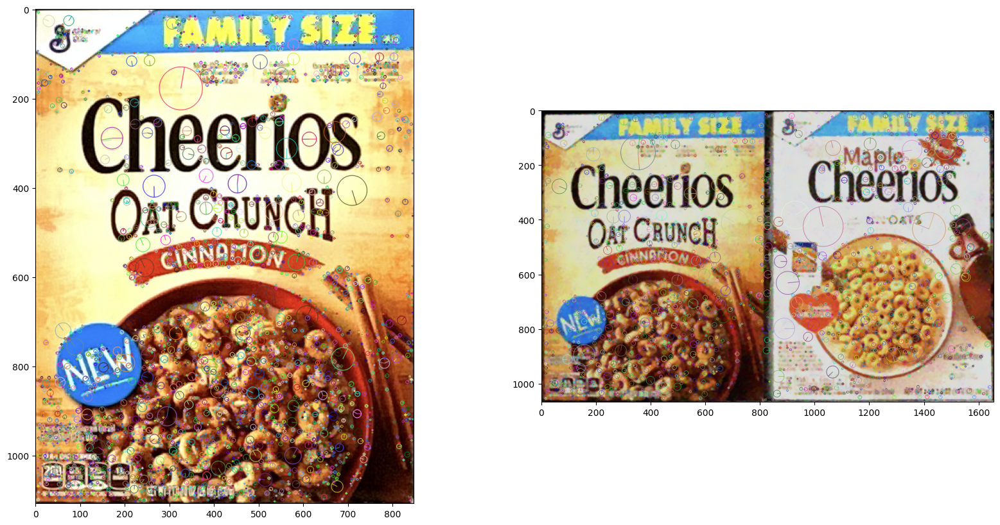

In [19]:
# Initiate SIFT detector
sift = cv2.SIFT_create()

kp_obj = sift.detect(obj_rgb)
kp_scene = sift.detect(scene1dn_rgb)

# find the keypoints and descriptors with SIFT
kp_obj, des_obj = sift.compute(obj_rgb, kp_obj)
kp_scene, des_scene = sift.compute(scene1dn_rgb, kp_scene)

# Number of keypoints
print(f'Number of Keypoints Obj: {len(kp_obj)}')
print(f'Number of Keypoints Scene: {len(kp_scene)}')

#Visualizing the keypoints on the img
obj_visualization = cv2.drawKeypoints(obj_rgb, kp_obj, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
scene_visualization = cv2.drawKeypoints(scene1dn_rgb, kp_scene, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
plt.imshow(obj_visualization)

plt.subplot(1,2,2)
plt.imshow(scene_visualization)

plt.show()

In [20]:
# Defining index for approximate kdtree algorithm
FLANN_INDEX_KDTREE = 1

# Defining parameters for algorithm
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

# Defining search params.
# checks=50 specifies the number of times the trees in the index should be recursively traversed.
# Higher values gives better precision, but also takes more time
search_params = dict(checks = 50)

# Initializing matcher
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Matching and finding the 2 closest elements for each query descriptor.
matches = flann.knnMatch(des_obj,des_scene,k=2)

good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)

In [21]:
# Checking if we found enough matching
MIN_MATCH_COUNT = 10

if len(good)>MIN_MATCH_COUNT:
    
    # building the corrspondences arrays of good matches
    src_pts = np.float32([ kp_obj[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp_scene[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    # Using RANSAC to estimate a robust homography.
    # It returns the homography M and a mask for the discarded points
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Mask of discarded point used in visualization
    matchesMask = mask.ravel().tolist()

    # Corners of the query image
    h,w,c = obj_rgb.shape
    print(h,w,c)
    pts = np.float32([ [0,0,],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)

    # Projecting the corners into the train image
    dst = cv2.perspectiveTransform(pts,M)
    print(dst[0])
    # Drawing the bounding box
    img_train_p = cv2.polylines(scene1dn_rgb,[np.int32(dst)],True,255,3, cv2.LINE_AA)
else:
    print( "Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT) )
    matchesMask = None

print(len(good))

1108 848 3
[[10.247544 14.121037]]
460


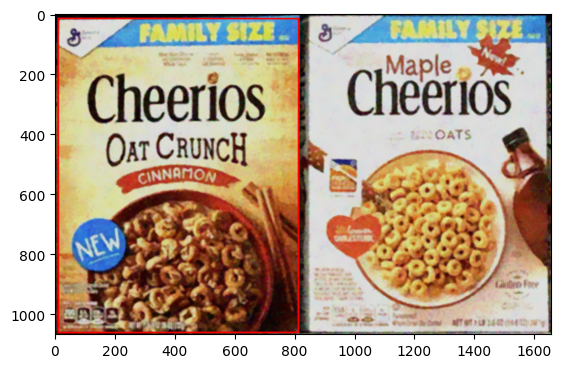

In [22]:
plt.imshow(scene1dn_rgb, 'gray')
plt.show()

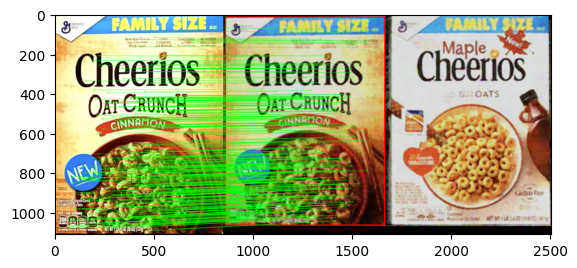

In [23]:
# Drawing the matches
draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None, # not draw keypoints only matching lines
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2) # not draw keypoints only lines
img3 = cv2.drawMatches(obj_rgb,kp_obj,scene1dn_rgb,kp_scene,good,None,**draw_params)
plt.imshow(img3, 'gray')
plt.show()

# TRACK A

In [24]:
MIN_MATCH_COUNT=70

def check_matching(img_obj_path, img_scene_path, treshold):
    
    img_ob = cv2.imread(img_obj_path)
    img_obj = cv2.cvtColor(img_ob, cv2.COLOR_BGR2RGB)

    scene_ob = cv2.imread(img_scene_path)
    img_scene = cv2.cvtColor(scene_ob, cv2.COLOR_BGR2RGB)

    sift =cv2.SIFT_create()
    kp_query = sift.detect(img_obj)
    kp_train =sift.detect(img_scene)
    kp_query, des_query = sift.compute(img_obj, kp_query)
    kp_train, des_train = sift.compute(img_scene, kp_train)

    #treshold_percentage = len(kp_query) * treshold

    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)

    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des_query, des_train, k=2)

    good = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good.append(m)

    if len(good) > treshold:
        #print(f'{img_obj_path} present in {img_scene_path}')
        
        # building the correspondences arrays of good matches
        src_pts = np.float32([kp_query[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp_train[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
        # Using RANSAC to estimate a robust homography.
        # It returns the homography M and a mask for the discarded points
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        # Mask of discarded point used in visualization
        matchesMask = mask.ravel().tolist()

        # Corners of the query image
        h, w,c = img_obj.shape
        pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)

        # Projecting the corners into the train image
        dst = cv2.perspectiveTransform(pts, M)
         
        ret_array=[h,w, dst[0][0], img_obj_path]       
        return ret_array
    else:
        #print(f'Not enough matches are found - {len(good)}/{treshold_percentage}')
        return []


In [25]:
def show_matches(background, instances):
    '''
    background is denoised background image
    instances is an array which contains elements structured like:
        [height, width, ]
    '''
    scene_ob = cv2.imread(background)
    img_scene = cv2.cvtColor(scene_ob, cv2.COLOR_BGR2RGB)

    n = len(instances) + 1
    
    plt.figure(figsize=(20,5))
    plt.subplot(1,n,1)
    plt.imshow(img_scene)

    for i in range(len(instances)):
        
        img_ob = cv2.imread(instances[i][3])
        img_obj = cv2.cvtColor(img_ob, cv2.COLOR_BGR2RGB)

        plt.subplot(1,n,i+2)
        plt.imshow(img_obj)

    plt.show()
        

In [26]:
def show_matches1(background, instances):
    '''
    background is the path to the denoised background image
    instances is an array which contains elements structured like:
        [height, width, position[], path_to_image]
        - height: height of the bounding box
        - width: width of the bounding box
        - position: [x, y] coordinates of the top-left corner
        - path_to_image: path to the object image
    '''
    # Load and prepare the background image
    scene_ob = cv2.imread(background)
    img_scene = cv2.cvtColor(scene_ob, cv2.COLOR_BGR2RGB)

    # Draw bounding boxes on the background image
    for instance in instances:
        height, width, position, _ = instance
        top_left_x, top_left_y = int(position[0]), int(position[1])
        bottom_right_x = top_left_x + int(width)
        bottom_right_y = top_left_y + int(height)
        
        # Draw rectangle on the background image
        img_scene = cv2.rectangle(img_scene, 
                                  (top_left_x, top_left_y), 
                                  (bottom_right_x, bottom_right_y), 
                                  (255, 0, 0), 20)  # Red bounding box with thickness of 2

    # Set up the plot with subplots
    n = len(instances) + 1
    plt.figure(figsize=(20, 5))
    
    # Show the background image with bounding boxes as the first subplot
    plt.subplot(1, n, 1)
    plt.imshow(img_scene)
    plt.title("Background with Bounding Boxes")
    
    # Show each instance image in its own subplot
    for i, instance in enumerate(instances):
        _, _, _, obj_image_path = instance
        
        # Load and convert each object image
        img_ob = cv2.imread(obj_image_path)
        img_obj = cv2.cvtColor(img_ob, cv2.COLOR_BGR2RGB)
        
        # Display object image in a subplot
        plt.subplot(1, n, i + 2)
        plt.imshow(img_obj)
        plt.title(f"Object {i + 1}")
    
    plt.show()

In [27]:
def show_output_submit(prod_instances):
    ''''
    Show the output of the detection in the style required by the professor
    '''
    for product in prod_instances:
        c = 1
        print(f"Product: {product['name']} - {product['count']} instance found")
        for instance in product['instances']:
            print(f'\t Instance {c} - position: {instance[2]}, width: {instance[1]} px, height:{instance[0]}px, scene:{instance[3]}')
            c = c+1



In [28]:
prod_instances=[]
for obj in objs_a:
    prod_description={}
    obj_instances=[]
    prod_description['name'] = extract_number(obj)
    for scene in dn_scenes_a:
        ret_array= check_matching(obj, scene, 80)
        
        #TODO: per mostrare la roba come voglio io qui dovrei intervenire, quando si vede cosa c'è in ogni scena
        show_matches(background=scene )
        
        #heigth, width, pos = check_matching(obj, scene, 0.027)
        if(len(ret_array)>0):
            ret_array.append(extract_number(scene))
            obj_instances.append(ret_array)
            #print(ret_array)
    prod_description['instances']=obj_instances    
    prod_description['count'] = len(obj_instances)
    prod_instances.append(prod_description)
    
print('###########################')


TypeError: show_matches() missing 1 required positional argument: 'instances'

In [ ]:
def obj_in_scenes():
    for scene in dn_scenes_a:
        print(f'Scene: {extract_number(scene)}')
        objs_scene=[]
        for obj in objs_a:
            ret_array= check_matching(obj, scene, 77)
            if ret_array:
                objs_scene.append(ret_array)
        show_matches1(background=scene, instances=objs_scene)    
        print('\n')

Scene: 1


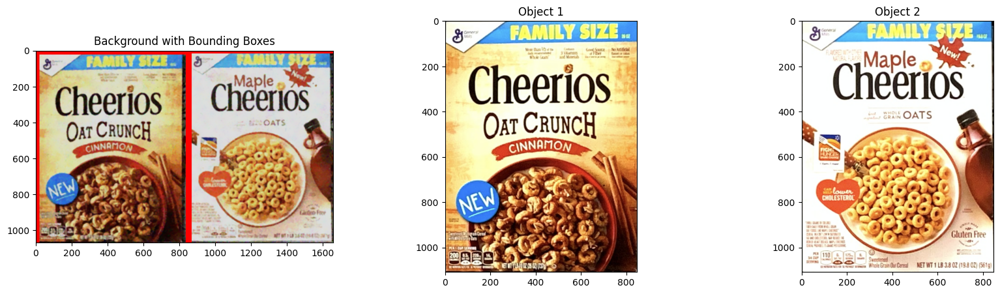



Scene: 2


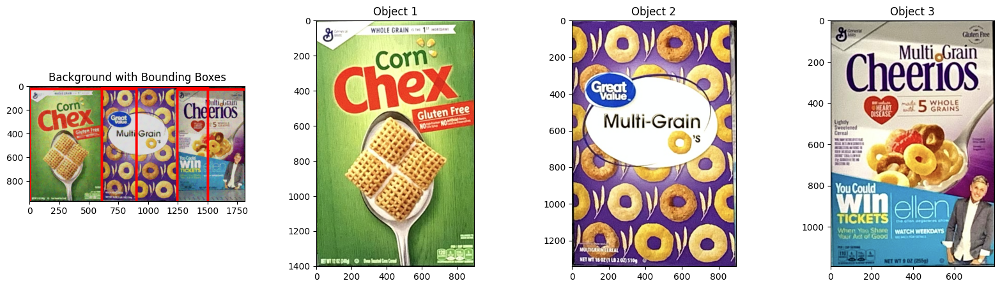



Scene: 3


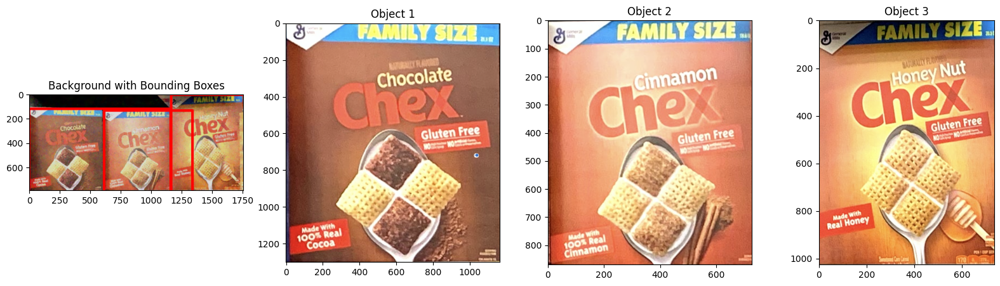



Scene: 4


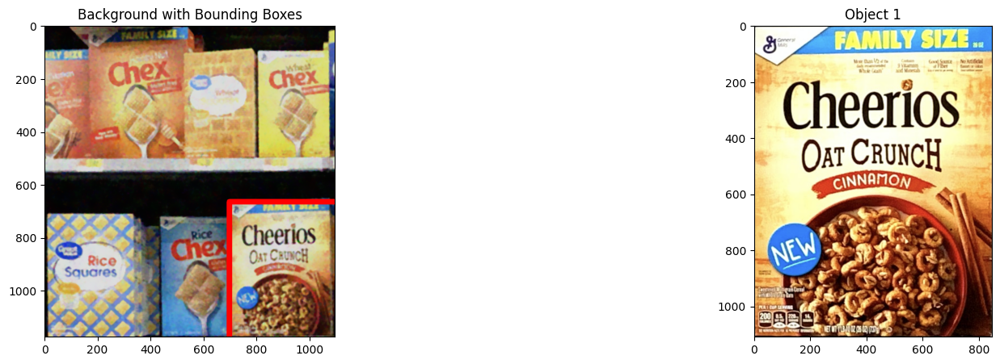



Scene: 5


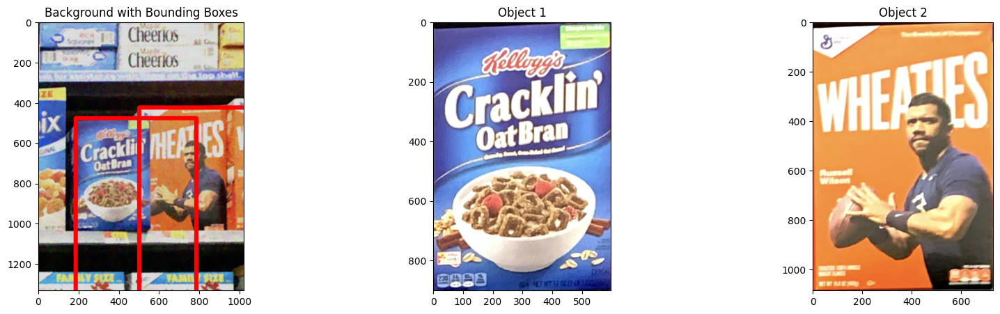

In [ ]:
obj_in_scenes()

In [ ]:
show_output_submit(prod_instances)

Product: 1 - 2 instance found
	 Instance 1 - position: [10.235656 13.805099], width: 848 px, height:1108px, scene:1
	 Instance 2 - position: [696.6757 664.448 ], width: 848 px, height:1108px, scene:4
Product: 2 - 2 instance found
	 Instance 1 - position: [846.99994    9.700405], width: 848 px, height:1108px, scene:1
	 Instance 2 - position: [1192.5354    -10.906257], width: 848 px, height:1108px, scene:2
Product: 3 - 1 instance found
	 Instance 1 - position: [ 3.3213933 23.144182 ], width: 900 px, height:1402px, scene:2
Product: 4 - 1 instance found
	 Instance 1 - position: [611.5938      7.7064795], width: 894 px, height:1342px, scene:2
Product: 5 - 1 instance found
	 Instance 1 - position: [1247.6182     28.867838], width: 792 px, height:1192px, scene:2
Product: 6 - 1 instance found
	 Instance 1 - position: [ -2.4387197 122.67934  ], width: 1164 px, height:1300px, scene:3
Product: 7 - 1 instance found
	 Instance 1 - position: [619.03375 134.75528], width: 726 px, height:870px, scene:

# Track B

In [ ]:
def show_box(img_path, dst):
    img_ob = cv2.imread(img_path)
    img = cv2.cvtColor(img_ob, cv2.COLOR_BGR2GRAY)
    img_train_p = cv2.polylines(img,[np.int32(dst)],True,255,3, cv2.LINE_AA)
    plt.imshow(img_train_p, 'gray')
    plt.show()

    pass

In [ ]:
#Save a denoised version of each background
def denoise_scenes(img_path, kind):
    #####BEFORE RUNNING THIS CREATE A 'denoised_scenes' folder inside 'dataset'
    img= cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    img_index= extract_number(img_path)

    median = cv2.medianBlur(img, 7)
    if kind=='dst':
        img = cv2.fastNlMeansDenoisingColored(median,None,10,10,7,21)
    elif kind=='bilateral':
        img = cv2.bilateralFilter(median, 10, 150, 150)

    img_write = cv2.cvtColor(img, cv2.IMREAD_GRAYSCALE)

    cv2.imwrite(f'./dataset/denoised_scenes/scene{img_index}.png', img_write)

In [ ]:
ref_path = './dataset/models/ref'

start_index_b = 15
end_index_b = 27

# Generate the array of file paths
objs_b = [f"{ref_path}{i}.png" for i in range(start_index_b, end_index_b + 1)]

print(objs_b)

['./dataset/models/ref15.png', './dataset/models/ref16.png', './dataset/models/ref17.png', './dataset/models/ref18.png', './dataset/models/ref19.png', './dataset/models/ref20.png', './dataset/models/ref21.png', './dataset/models/ref22.png', './dataset/models/ref23.png', './dataset/models/ref24.png', './dataset/models/ref25.png', './dataset/models/ref26.png', './dataset/models/ref27.png']


In [ ]:
scenes_path = './dataset/scenes/scene'

scene_idx_start_b = 6
scene_idx_end_b = 12

scenes_b = [f"{scenes_path}{i}.png" for i in range(scene_idx_start_b, scene_idx_end_b + 1)]
print(scenes_b)

for scene in scenes_b:
    denoise_scenes(scene, 'bilateral')

['./dataset/scenes/scene6.png', './dataset/scenes/scene7.png', './dataset/scenes/scene8.png', './dataset/scenes/scene9.png', './dataset/scenes/scene10.png', './dataset/scenes/scene11.png', './dataset/scenes/scene12.png']


In [ ]:
dn_scenes_b = ['./dataset/denoised_scenes/scene6.png', './dataset/denoised_scenes/scene7.png', './dataset/denoised_scenes/scene8.png',
        './dataset/denoised_scenes/scene9.png', './dataset/denoised_scenes/scene10.png', './dataset/denoised_scenes/scene11.png', './dataset/denoised_scenes/scene12.png']

In [ ]:
def siftDetect(img_path):
    sift = cv2.SIFT_create()

    img_ob = cv2.imread(img_path)
    img = cv2.cvtColor(img_ob, cv2.COLOR_BGR2GRAY)

    #this is the computing of the keypoints and descriptors
    keypoints, descriptors = sift.detectAndCompute(img, None)

    return keypoints, descriptors


In [ ]:
def flannMatch(img_ref_path, img_scene_path):
    FLANN_INDEX_KDTREE = 1

    #img_ob = cv2.imread(img_ref_path)
    #img_ref = cv2.cvtColor(img_ob, cv2.COLOR_BGR2GRAY)

    #scene_ob = cv2.imread(img_scene_path)
    #img_scene = cv2.cvtColor(scene_ob, cv2.COLOR_BGR2GRAY)

    # Defining parameters for algorithm
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)

    # Defining search params.
    # checks=50 specifies the number of times the trees in the index should be recursively traversed.
    # Higher values gives better precision, but also takes more time
    search_params = dict(checks = 50)

    # Initializing matcher
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    kp_ref, des_ref = siftDetect(img_ref_path)
    kp_scene, des_scene = siftDetect(img_scene_path)

    # Matching and finding the 2 closest elements for each query descriptor.
    matches = flann.knnMatch(des_ref,des_scene,k=2)
    

    return matches

    

In [ ]:
def loweFilter(matches):
    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)
    return good

In [ ]:
def homography(good, img_ref_path, img_scene_path, treshold):
    img_ob = cv2.imread(img_ref_path)
    img_ref = cv2.cvtColor(img_ob, cv2.COLOR_BGR2GRAY)
    
    if len(good) > treshold:
        print(f'{img_ref_path} present in {img_scene_path}')
        kp_ref, des_ref = siftDetect(img_ref_path)
        kp_scene, des_scene = siftDetect(img_scene_path)
        # building the correspondences arrays of good matches
        src_pts = np.float32([kp_ref[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
        # Using RANSAC to estimate a robust homography.
        # It returns the homography M and a mask for the discarded points
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

        # Mask of discarded point used in visualization
        matchesMask = mask.ravel().tolist()

        # Corners of the query image
        h, w = img_ref.shape
        pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)

        # Projecting the corners into the train image
        dst = cv2.perspectiveTransform(pts, M)
        
        ret_array=[h,w, dst[0][0]]       
        return ret_array
    else:
        #print(f'Not enough matches are found - {len(good)}/{treshold_percentage}')
        return []

In [ ]:
def check_matching(img_ref_path, img_scene_path):
    matches = flannMatch(img_ref_path, img_scene_path)
    good = loweFilter(matches)
    ret_array = homography(good, img_ref_path, img_scene_path, 10)
    return ret_array

In [ ]:
'''def fillArea(img, dst):
    mask = np.zeros_like(img)
    cv2.fillPoly(mask, np.int32(dst), (255,))
    img = cv2.add(img, mask)
    return img'''

'def fillArea(img, dst):\n    mask = np.zeros_like(img)\n    cv2.fillPoly(mask, np.int32(dst), (255,))\n    img = cv2.add(img, mask)\n    return img'

In [ ]:
def fillArea(img, dst):
    # Ensure dst is a NumPy array
    dst = np.array(dst, dtype=np.int32)
    
    # Reshape if needed (assuming dst is a flat list of points)
    if dst.ndim == 1:
        dst = dst.reshape((-1, 2))
    
    # Ensure dst has the shape (1, n, 2) for fillPoly
    dst = dst.reshape((1, -1, 2))
    
    mask = np.zeros_like(img)
    cv2.fillPoly(mask, dst, (255,))
    img = cv2.add(img, mask)
    return img

In [ ]:
for scene in dn_scenes_b:
    for obj in objs_b:
        ret_array= check_matching(img_ref_path=obj, img_scene_path=scene)
    print('\n')

./dataset/models/ref15.png present in ./dataset/denoised_scenes/scene6.png
./dataset/models/ref17.png present in ./dataset/denoised_scenes/scene6.png
./dataset/models/ref23.png present in ./dataset/denoised_scenes/scene6.png


./dataset/models/ref16.png present in ./dataset/denoised_scenes/scene7.png


./dataset/models/ref17.png present in ./dataset/denoised_scenes/scene8.png
./dataset/models/ref18.png present in ./dataset/denoised_scenes/scene8.png
./dataset/models/ref23.png present in ./dataset/denoised_scenes/scene8.png
./dataset/models/ref24.png present in ./dataset/denoised_scenes/scene8.png
./dataset/models/ref26.png present in ./dataset/denoised_scenes/scene8.png
./dataset/models/ref27.png present in ./dataset/denoised_scenes/scene8.png


./dataset/models/ref16.png present in ./dataset/denoised_scenes/scene9.png
./dataset/models/ref19.png present in ./dataset/denoised_scenes/scene9.png


./dataset/models/ref21.png present in ./dataset/denoised_scenes/scene10.png
./dataset/models

In [ ]:
i = scene_idx_start_b
for scene in dn_scenes_b:
    #transform the path into a scene
    scene_ob = cv2.imread(scene)
    img_scene = cv2.cvtColor(scene_ob, cv2.COLOR_BGR2GRAY)

    #now parameters we need
    dst_list = []
    object_info_list = []

    kp_scene, dsp_scene = siftDetect(scene)
    img_scene_c = img_scene.copy()
    img_scene_c_path = f'dataset\copied_images\scene{i}.png'
    cv2.imwrite(img_scene_c_path, img_scene_c)
    

    for ref in objs_b:
        img_ob = cv2.imread(ref)
        img_ref = cv2.cvtColor(img_ob, cv2.COLOR_BGR2GRAY)
        while True:
            ret_array = check_matching(ref, scene)
            dst = ret_array[2]
            if dst is None:
                break

            print(dst)
            dst_list.extend(np.int32(dst).flatten())
            print(dst_list)  # Output: [418, 165]
            img_scene_c = fillArea(img_scene_c, dst)
            img_scene_c = cv2.cvtColor(img_scene_c, cv2.COLOR_BGR2GRAY)
            kp_scene, dsp_scene = siftDetect(img_scene_c_path)

    show_box(scene, dst_list)
    i = i+1

    

./dataset/models/ref15.png present in ./dataset/denoised_scenes/scene6.png
[419.51138 166.76587]
[419, 166]


error: OpenCV(4.9.0) /Users/xperience/GHA-OpenCV-Python2/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/color.simd_helpers.hpp:92: error: (-2:Unspecified error) in function 'cv::impl::(anonymous namespace)::CvtHelper<cv::impl::(anonymous namespace)::Set<3, 4, -1>, cv::impl::(anonymous namespace)::Set<1, -1, -1>, cv::impl::(anonymous namespace)::Set<0, 2, 5>, cv::impl::(anonymous namespace)::NONE>::CvtHelper(cv::InputArray, cv::OutputArray, int) [VScn = cv::impl::(anonymous namespace)::Set<3, 4, -1>, VDcn = cv::impl::(anonymous namespace)::Set<1, -1, -1>, VDepth = cv::impl::(anonymous namespace)::Set<0, 2, 5>, sizePolicy = cv::impl::(anonymous namespace)::NONE]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 1


In [ ]:
for scene in dn_scenes_b:
    print(scene)
    for ref in objs_b:
        print(ref)
        img_rgb = cv2.imread(scene)
        assert img_rgb is not None, "file could not be read, check with os.path.exists()"
        img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
        template = cv2.imread(ref)
        assert template is not None, "file could not be read, check with os.path.exists()"
        w, h, c = template.shape
        
        res = cv2.matchTemplate(img_gray,template,cv2.TM_CCOEFF_NORMED)
        if len(res)>0:
            threshold = 0.8
            loc = np.where( res >= threshold)
            for pt in zip(*loc[::-1]):
                cv2.rectangle(img_rgb, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)
        else:
            print("[]")

        idx = extract_number(scene) 
        cv2.imwrite(f'dataset/copied_images/scene{idx}.png',img_rgb)

./dataset/denoised_scenes/scene6.png
./dataset/models/ref15.png


error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\templmatch.cpp:1164: error: (-215:Assertion failed) (depth == CV_8U || depth == CV_32F) && type == _templ.type() && _img.dims() <= 2 in function 'cv::matchTemplate'
